# EXPERIMENT - STATE-GROUP-3

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [7]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [9]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 250

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 16


Currently evaluated configs:
 Samples: 250 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


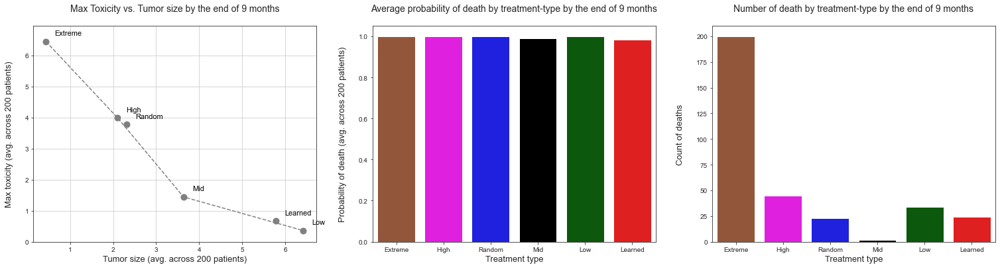

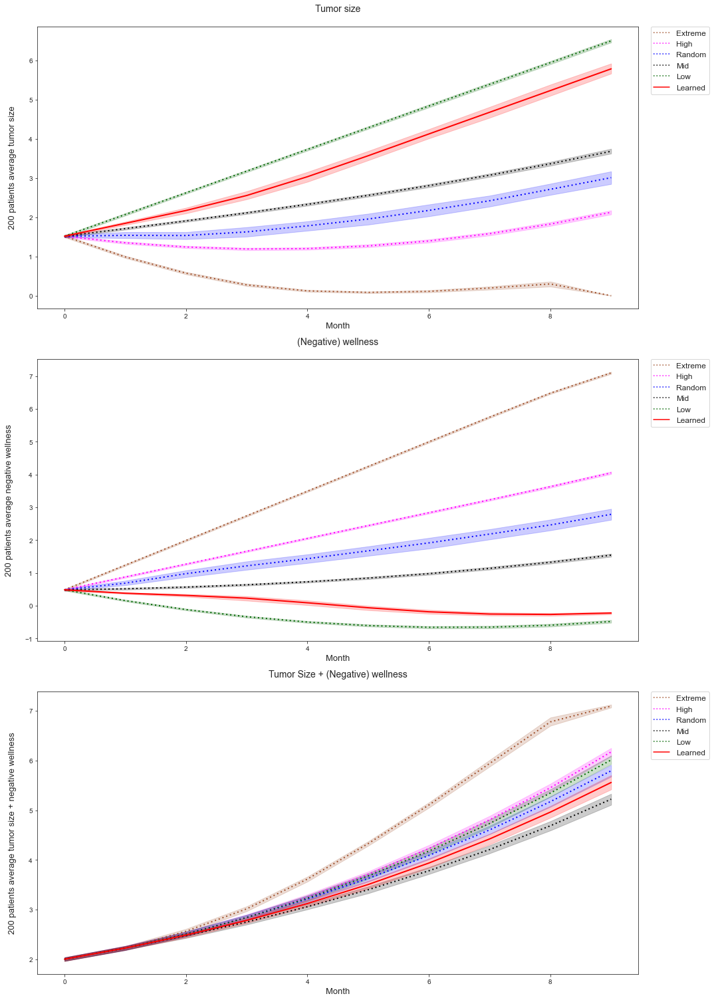


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 5.780419248040038
                         - Avg. max. toxicity : 0.6734443146685929
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.659587051173389
                         - Avg. prob. of death : 0.9833152164411229



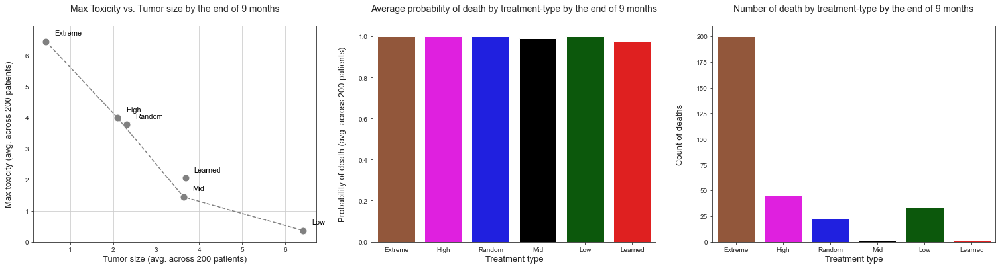

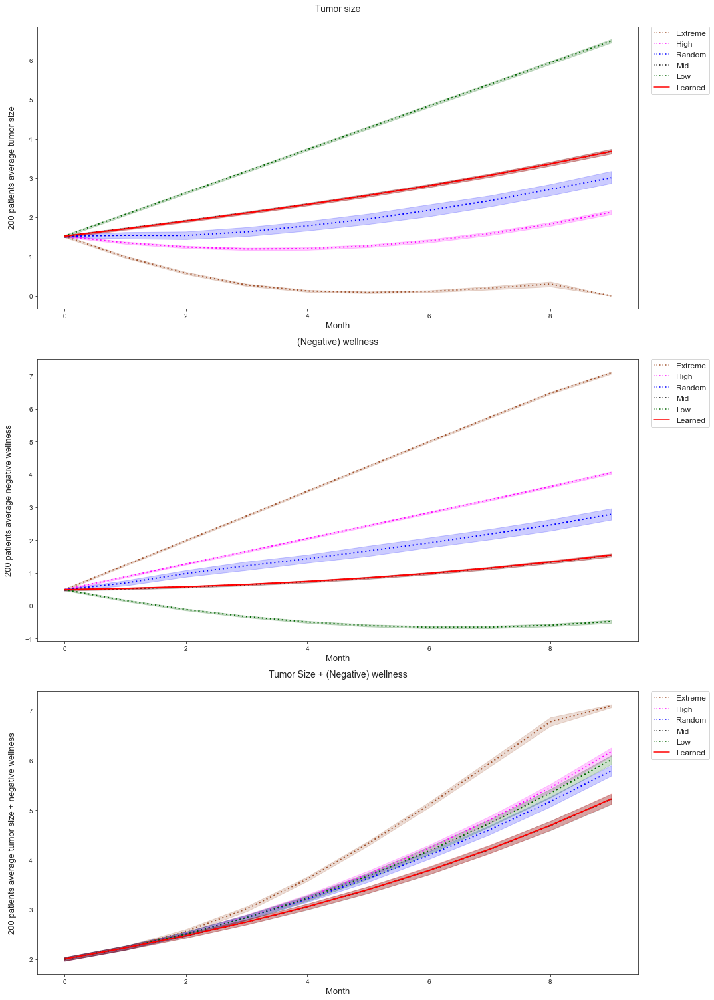


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 3.680007449920822
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.639828369744704
                         - Avg. prob. of death : 0.9778944923768366



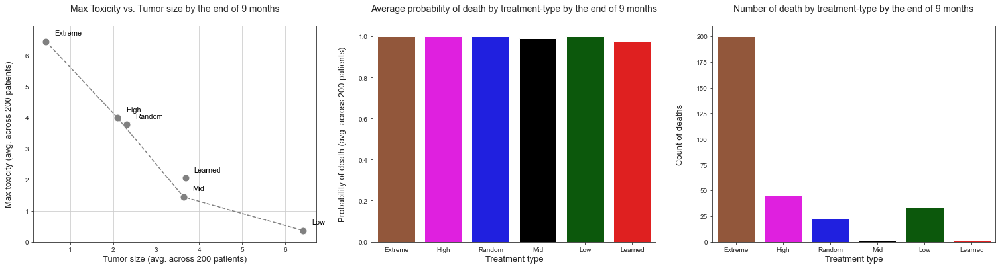

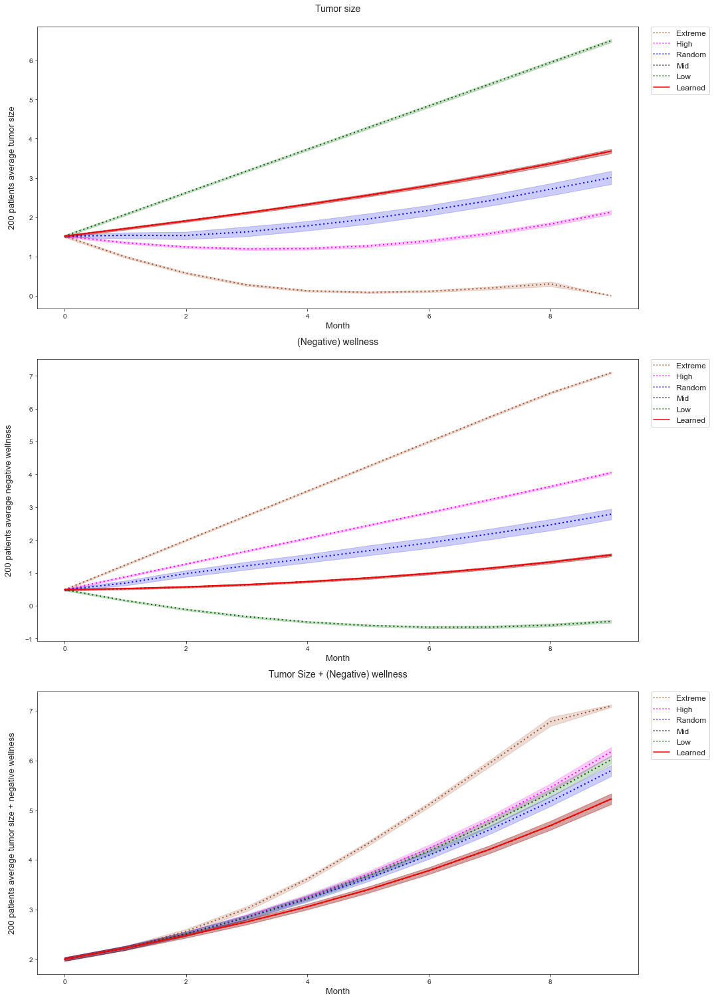


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.6798261005924435
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.639602642889048
                         - Avg. prob. of death : 0.9775073555487236



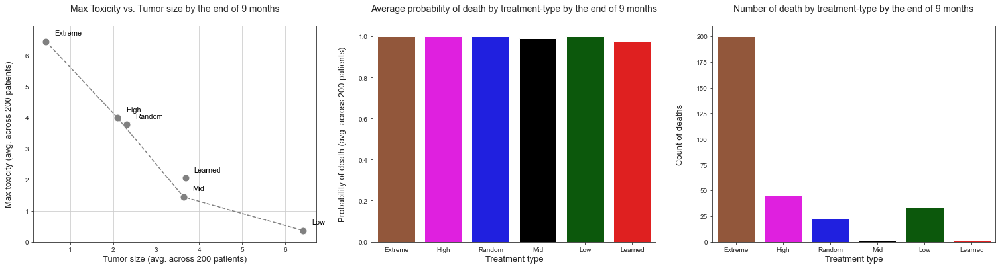

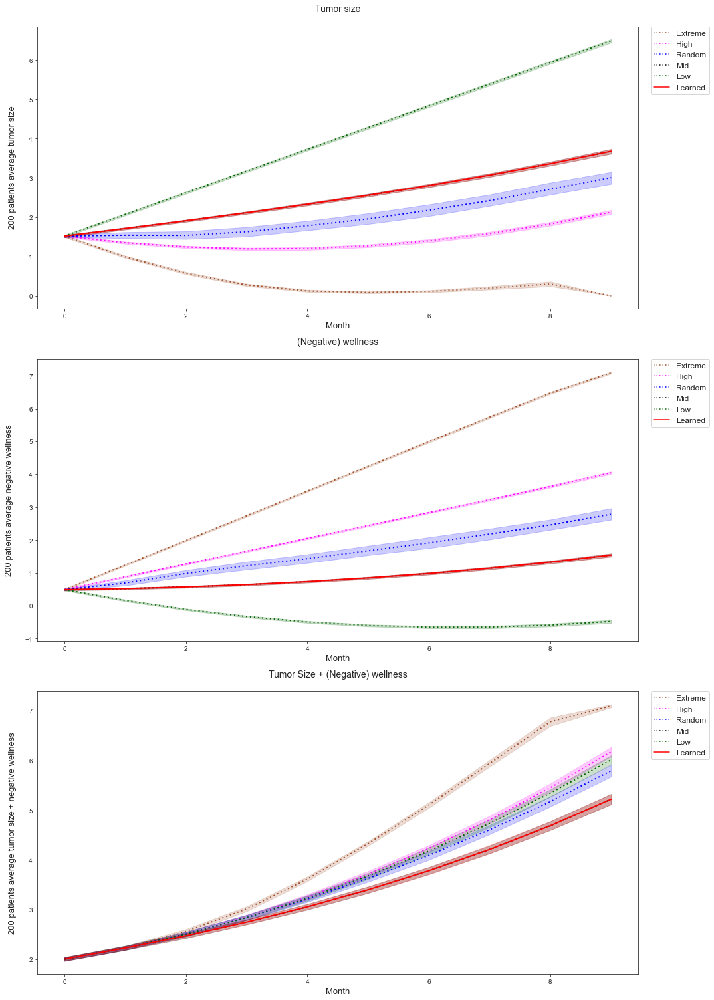


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.63944358735596
                         - Avg. prob. of death : 0.9769428858447313



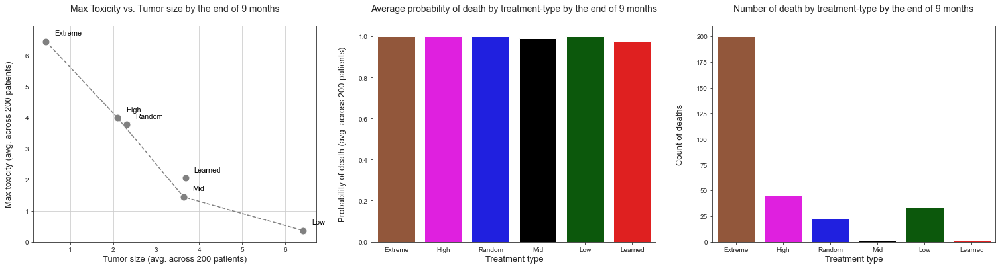

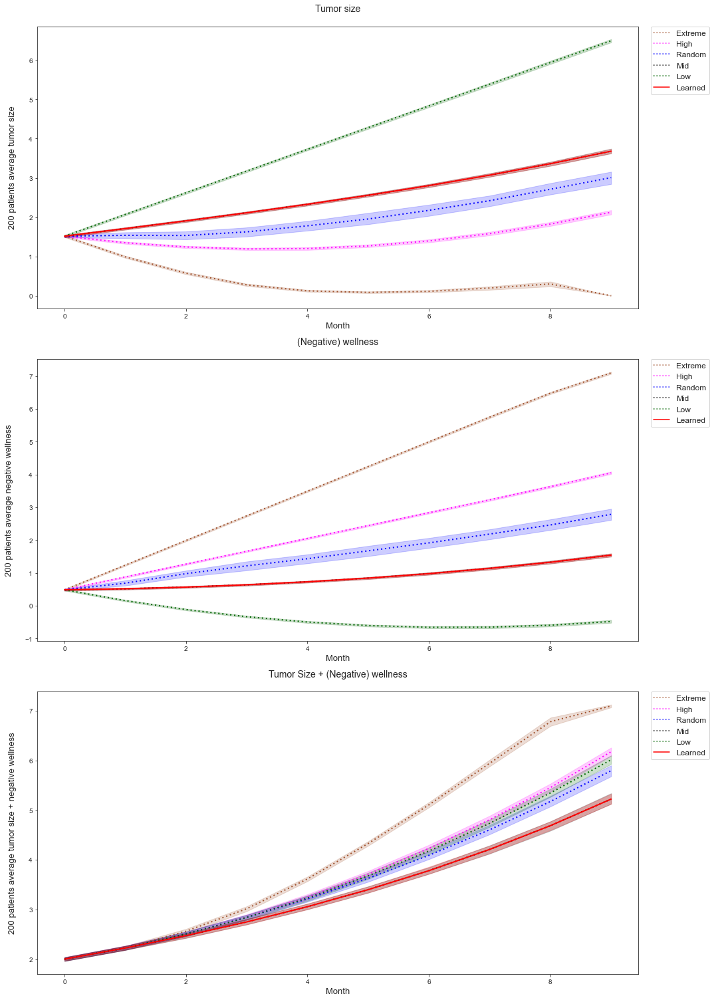


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.63944358735596
                         - Avg. prob. of death : 0.9769428858447313



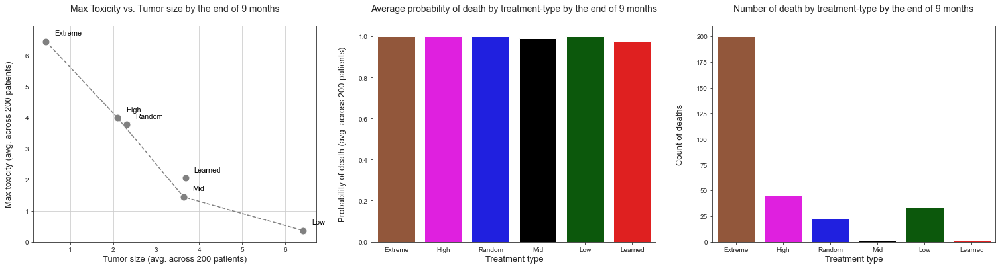

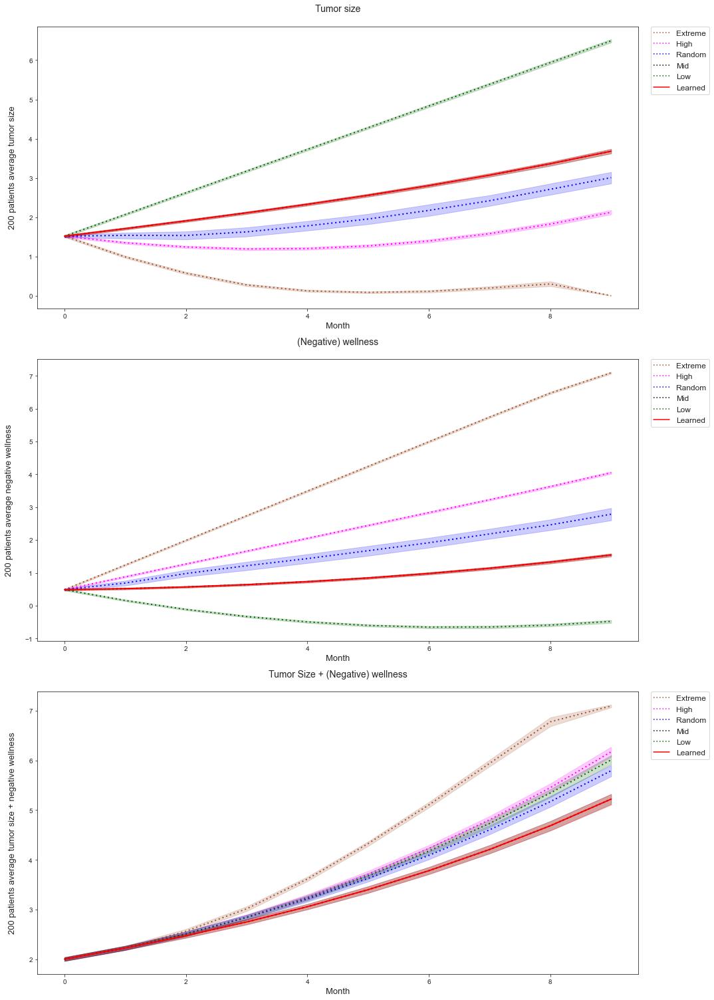


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.63944358735596
                         - Avg. prob. of death : 0.9769428858447313



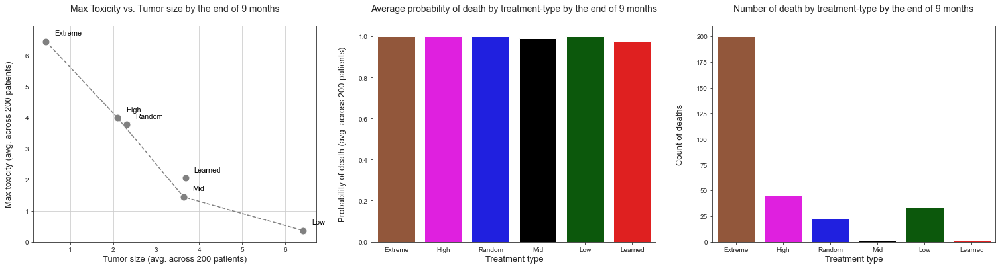

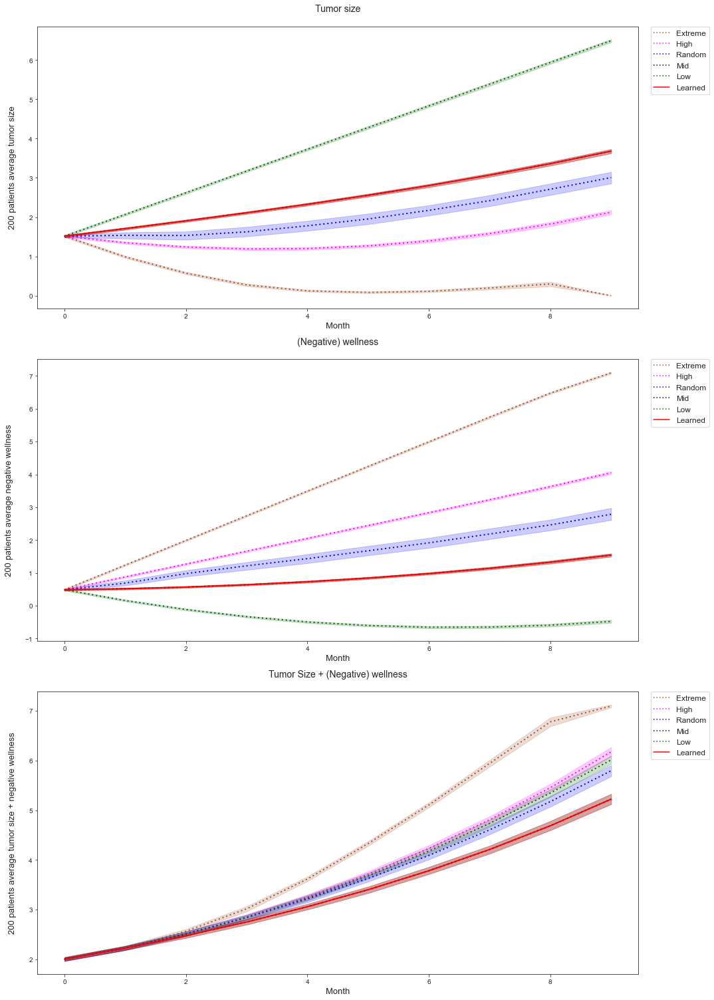


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.63944358735596
                         - Avg. prob. of death : 0.9769428858447313



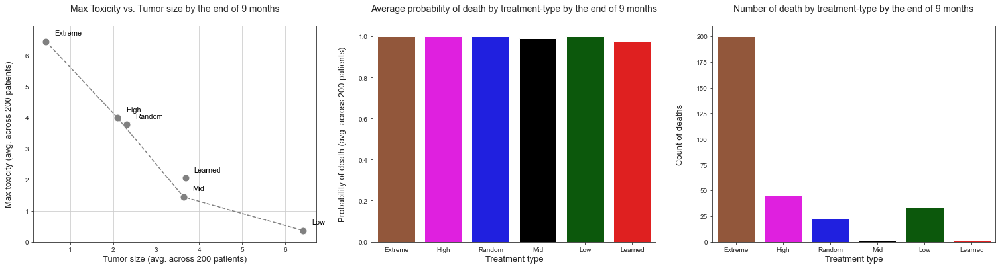

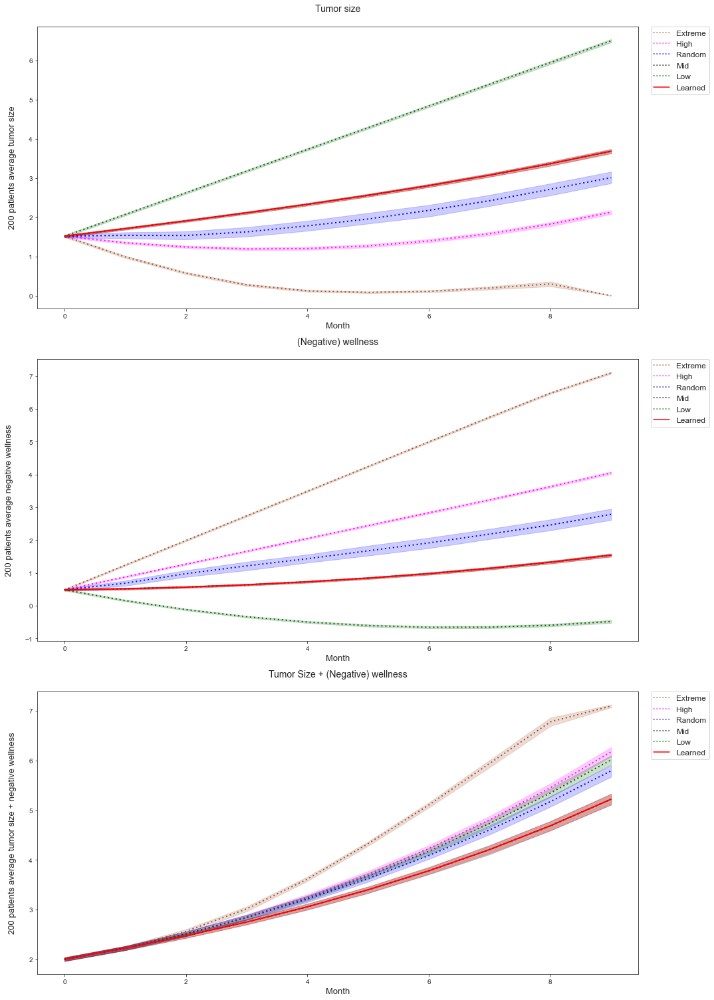


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.63944358735596
                         - Avg. prob. of death : 0.9769428858447313



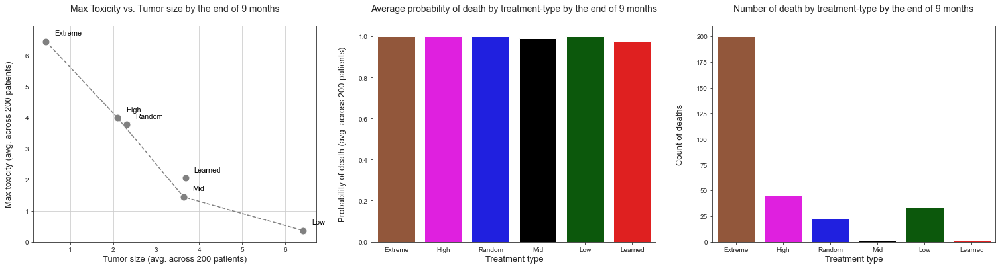

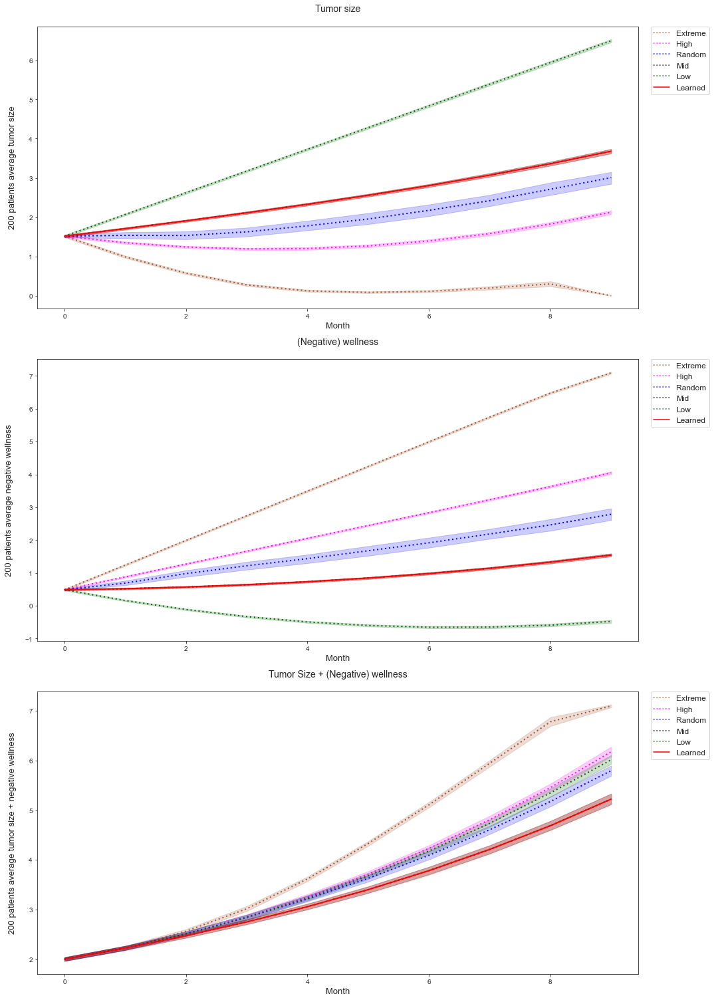


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 3.6799901588943147
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.63944358735596
                         - Avg. prob. of death : 0.9769428858447313



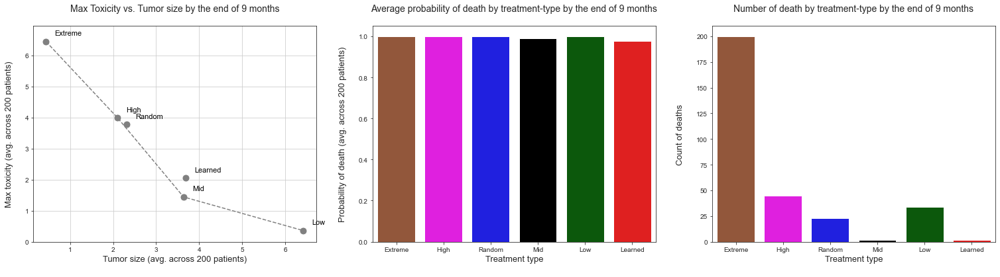

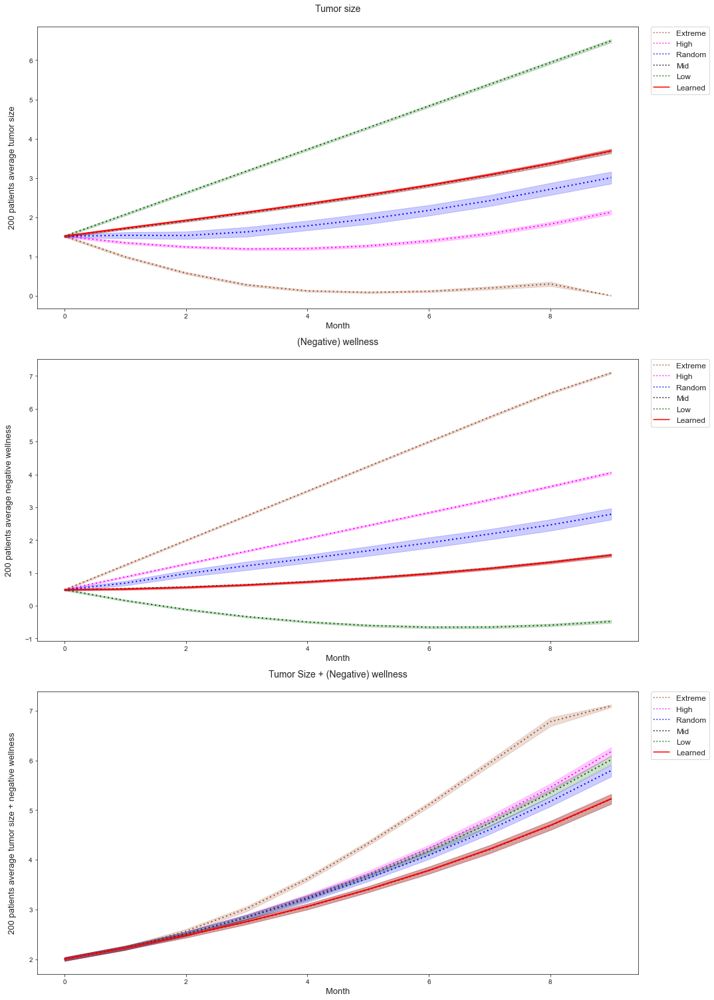


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 3.6885234763260866
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6399029579425743
                         - Avg. prob. of death : 0.9781040443535511


Evaluations: 100%|██████████| 1/1 [1:19:44<00:00, 4784.57s/it]


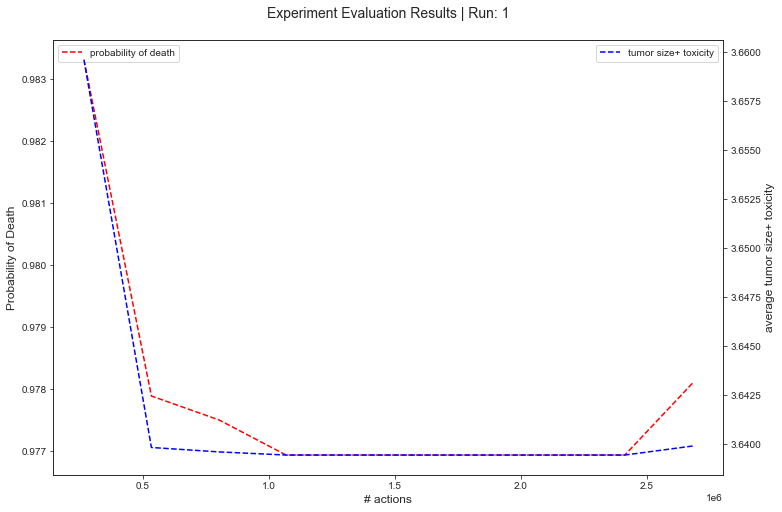

In [10]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 9
                                                , treatment_length_eval     = 9
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [11]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 250

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 16


Currently evaluated configs:
 Samples: 250 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


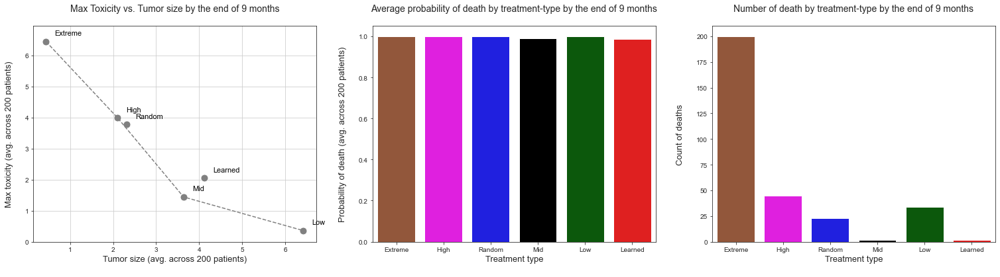

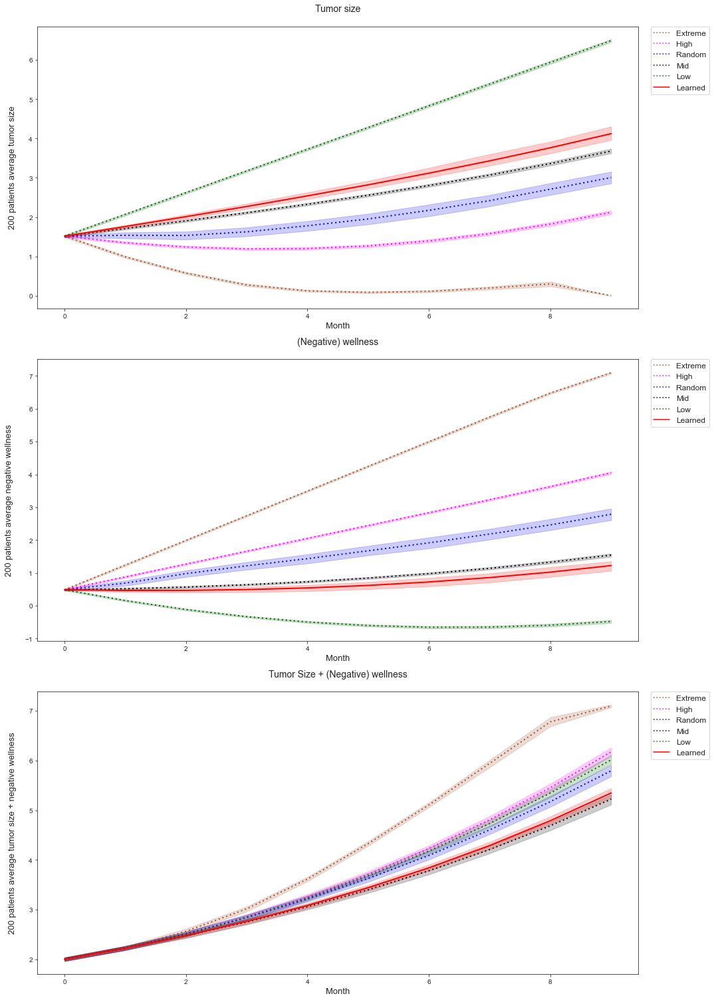


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.124411814876279
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6470640176438325
                         - Avg. prob. of death : 0.9873121254698844



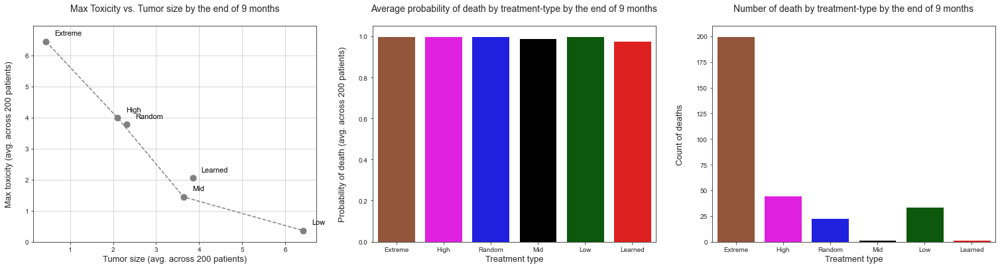

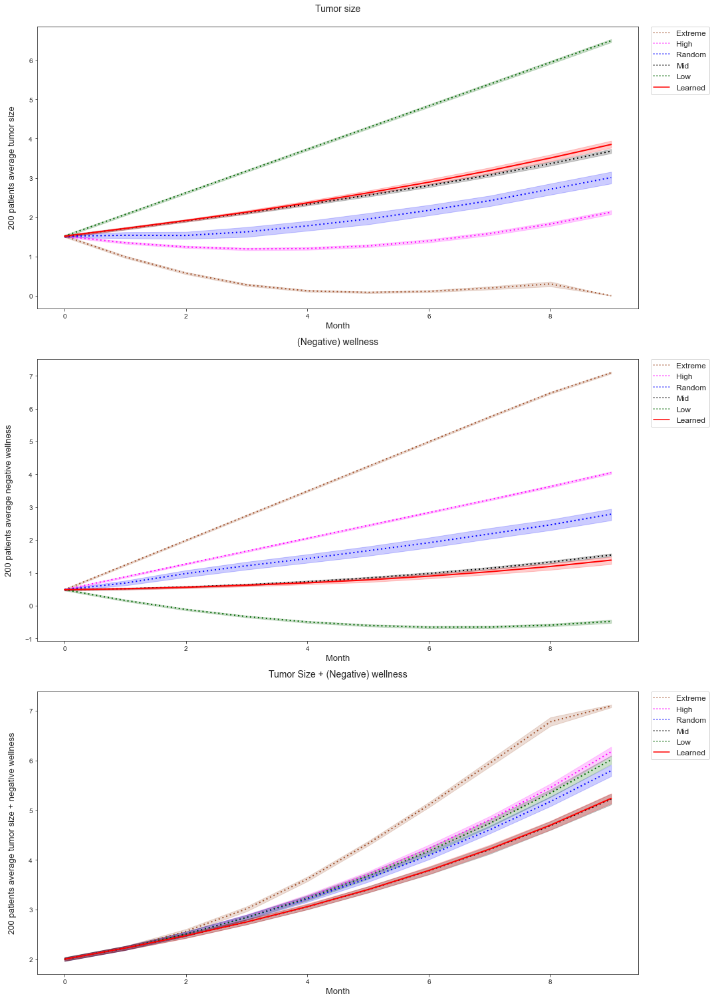


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 3.8507660237894266
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6402499371110864
                         - Avg. prob. of death : 0.9787088210655441



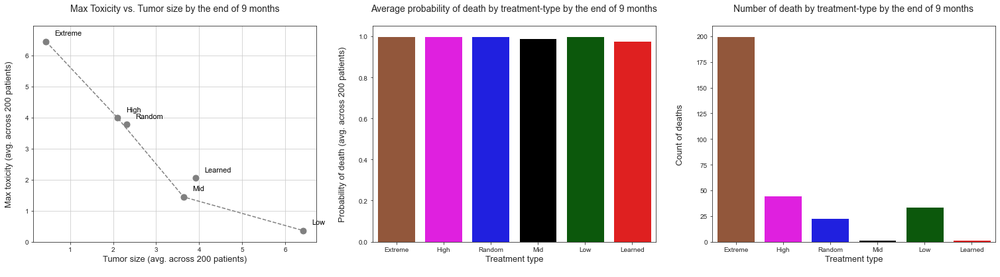

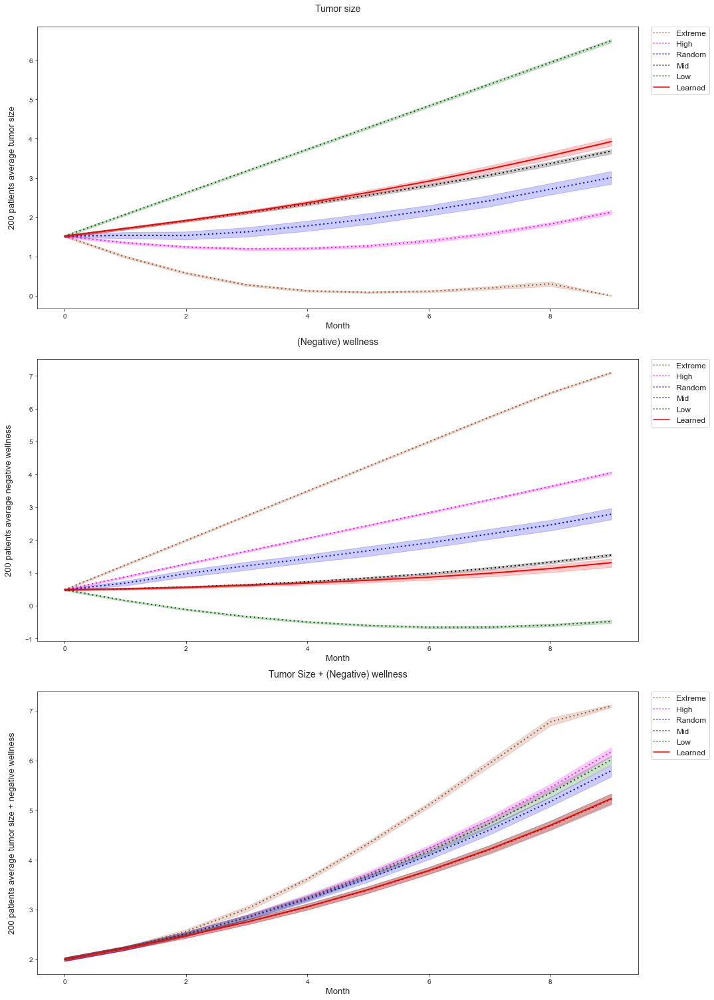


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.9235832016684857
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.640149824154831
                         - Avg. prob. of death : 0.9786878053218792



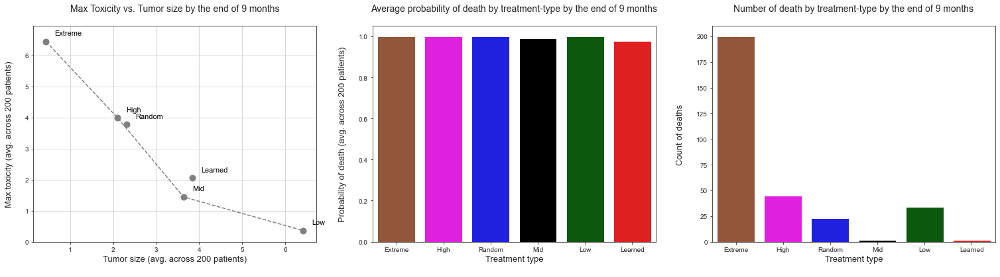

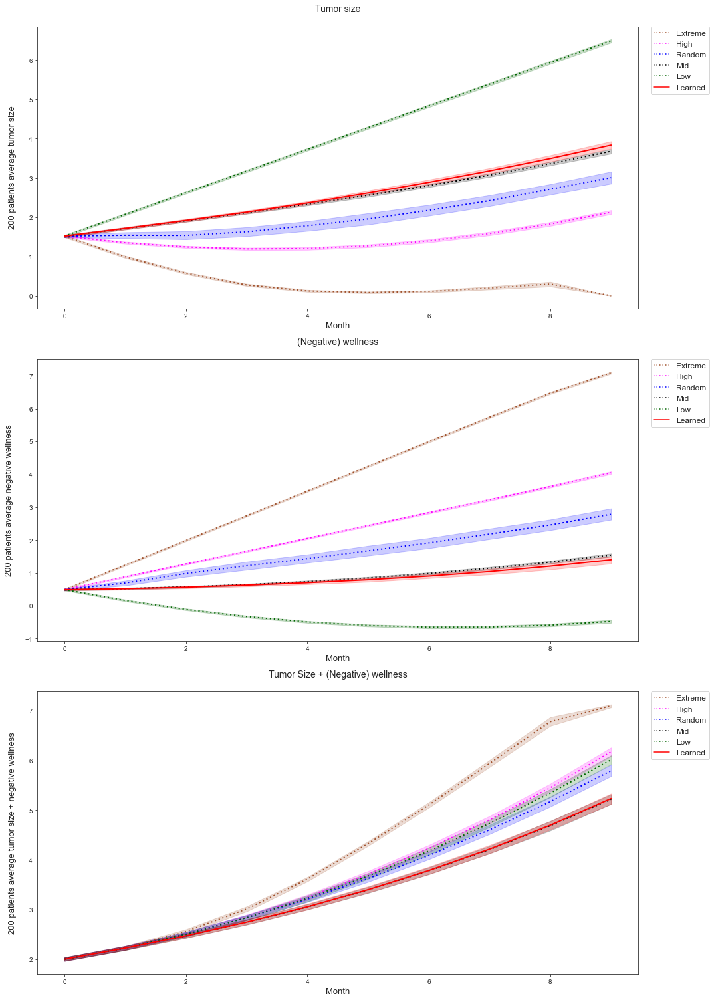


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 3.836681968223495
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6401866756565147
                         - Avg. prob. of death : 0.9785559584628765



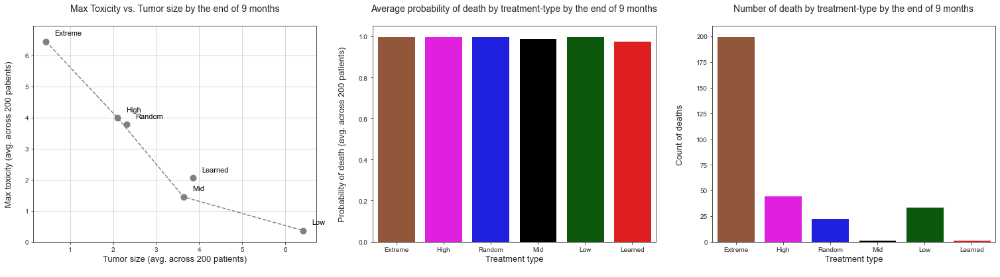

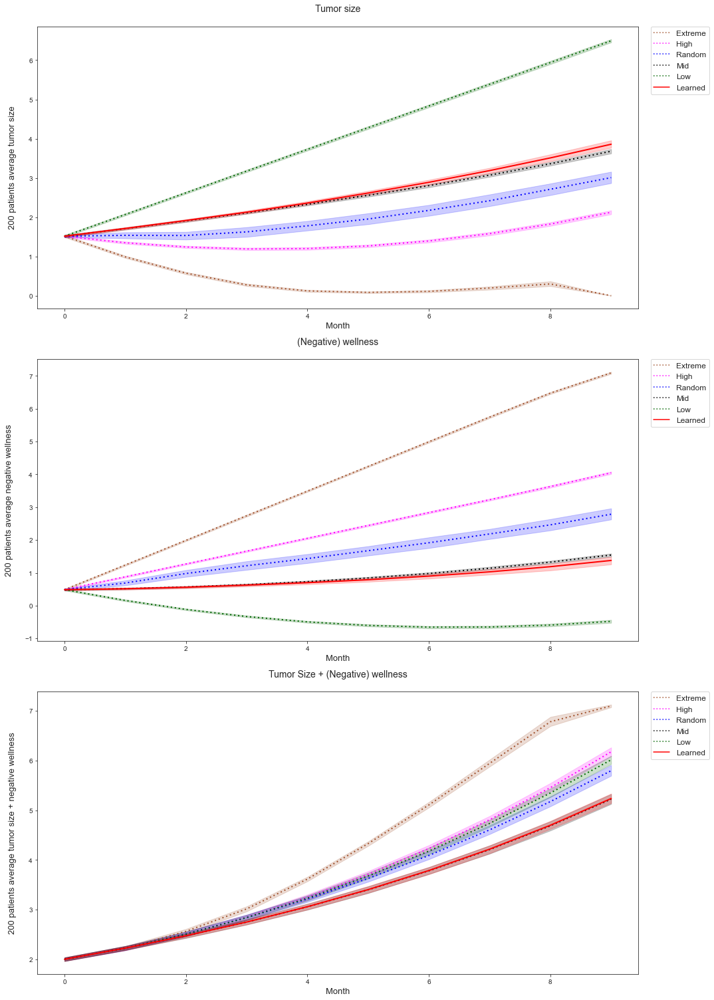


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 3.8577636845698198
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6401520954384936
                         - Avg. prob. of death : 0.9784722583262883



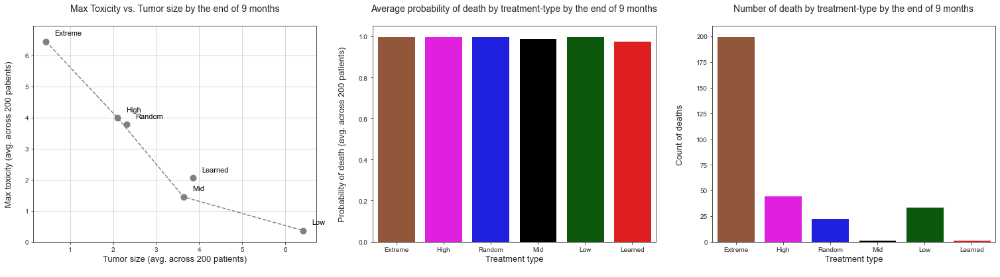

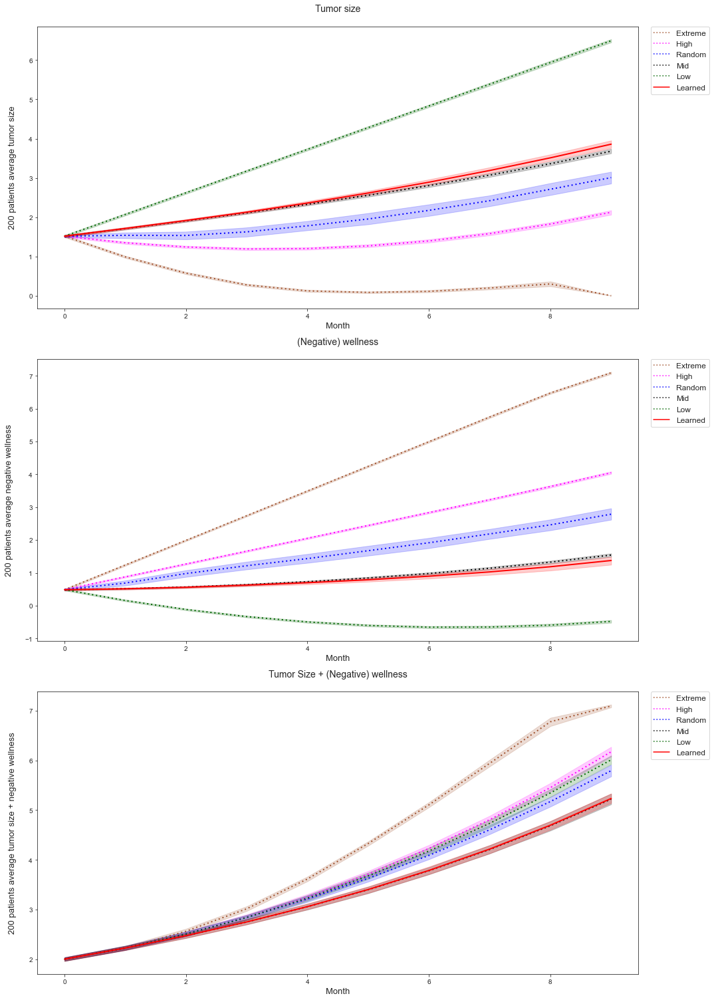


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 3.858943676442179
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6401451480985676
                         - Avg. prob. of death : 0.9784598093867888



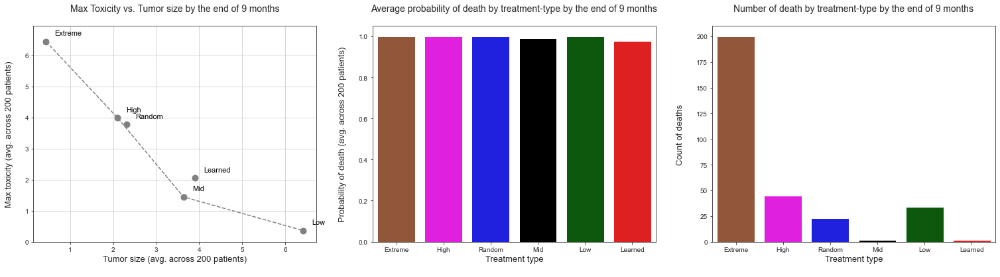

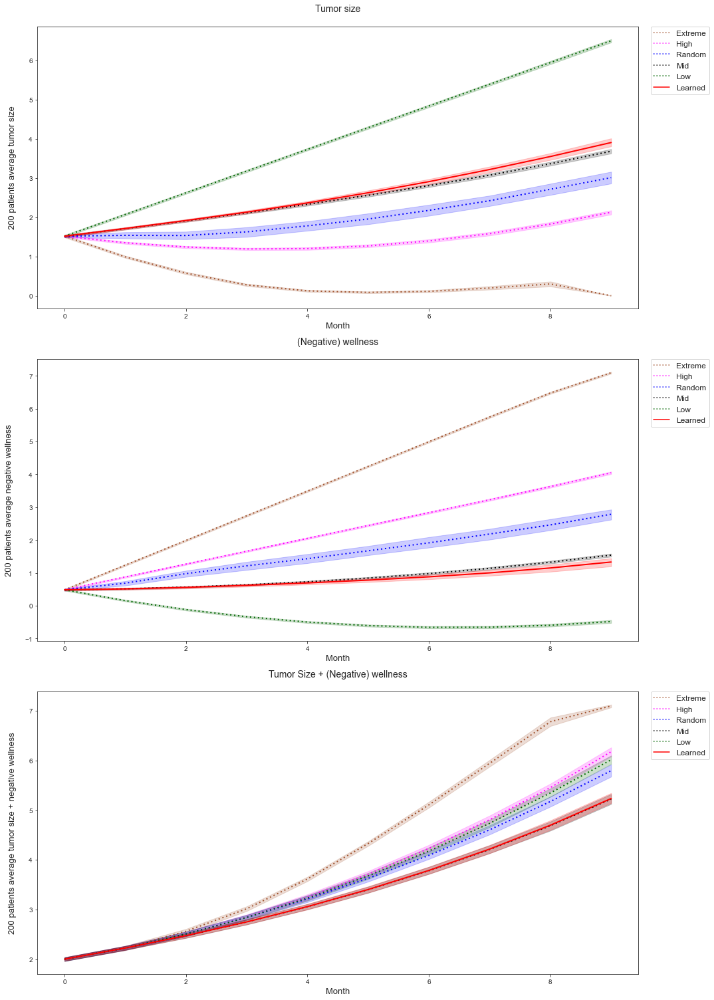


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.901357292880985
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6401252536916866
                         - Avg. prob. of death : 0.9784433867738958



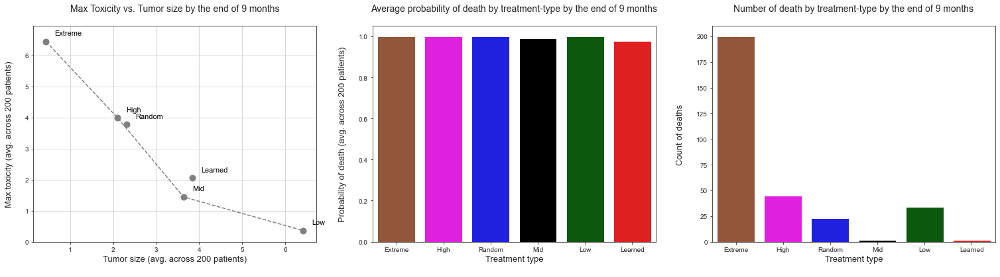

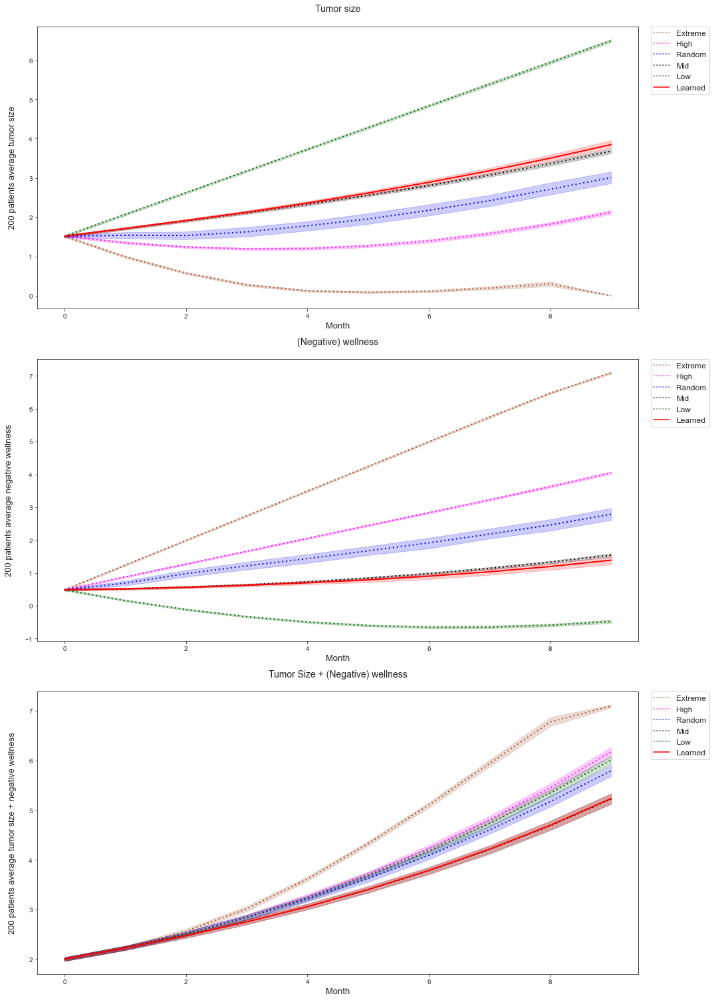


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.8474459682234947
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6401730427355345
                         - Avg. prob. of death : 0.978501447269356



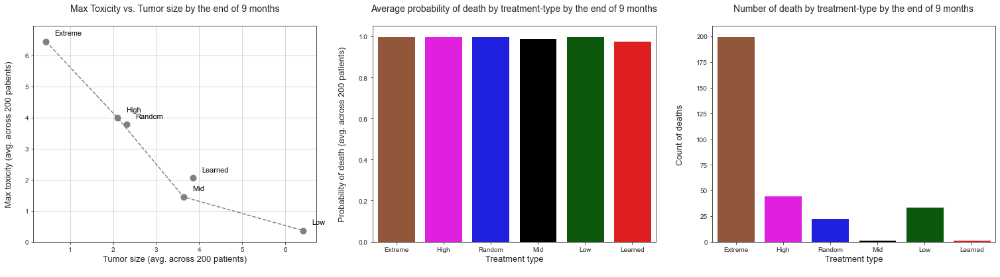

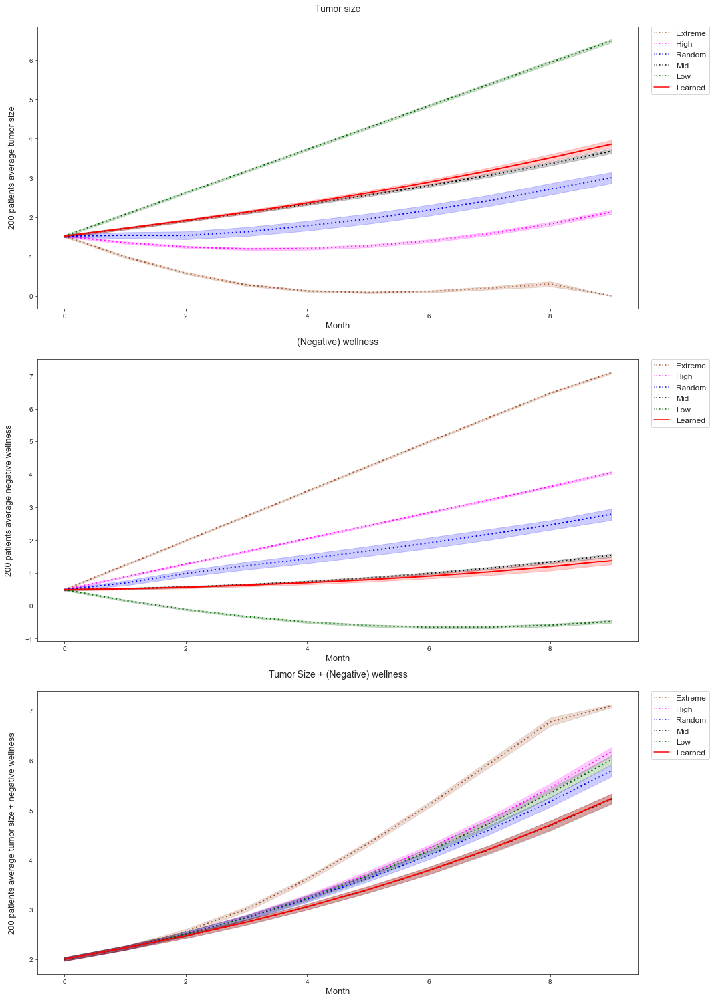


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 3.858943676442179
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6401451480985676
                         - Avg. prob. of death : 0.9784598093867888



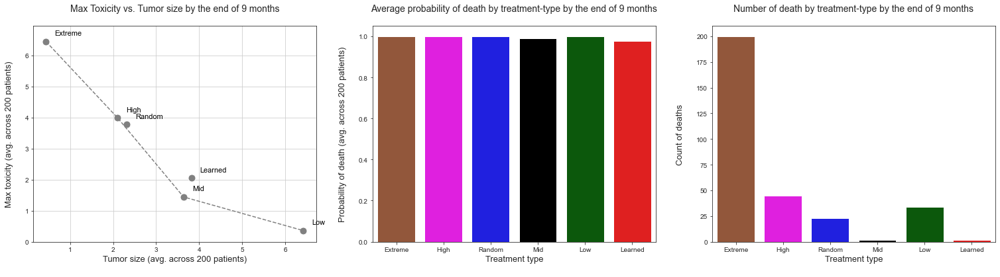

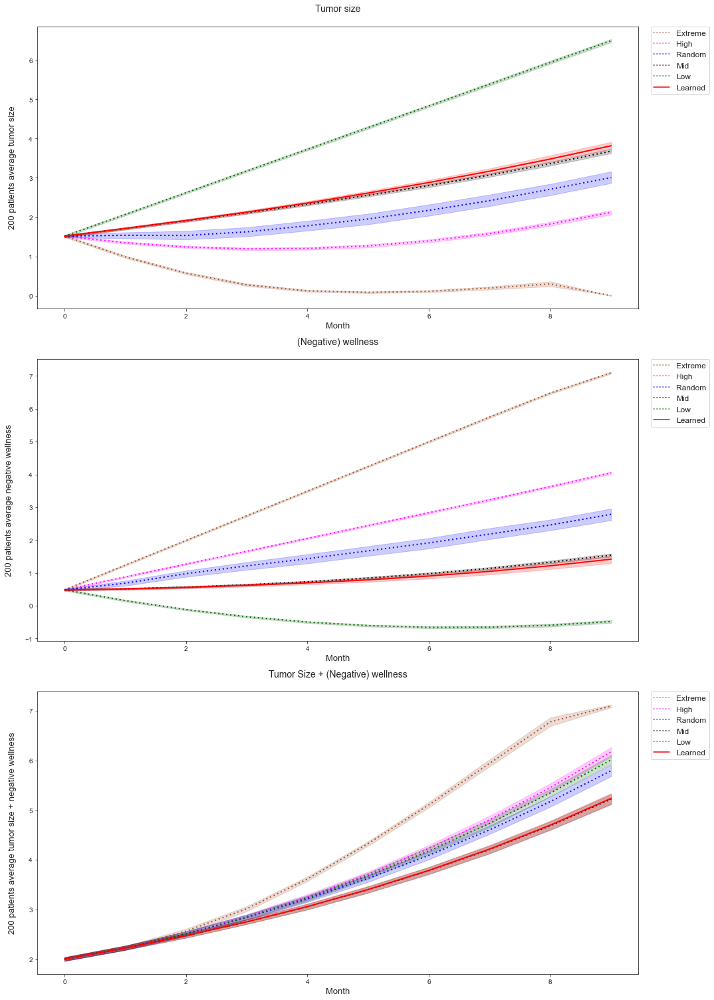


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 3.8174911656653436
                         - Avg. max. toxicity : 2.0535971361433356
                         - Avg. tumor size + toxicity (at the end of 9 months): 3.6402252914182642
                         - Avg. prob. of death : 0.9786400236829104


Evaluations: 100%|██████████| 1/1 [56:56<00:00, 3416.73s/it]


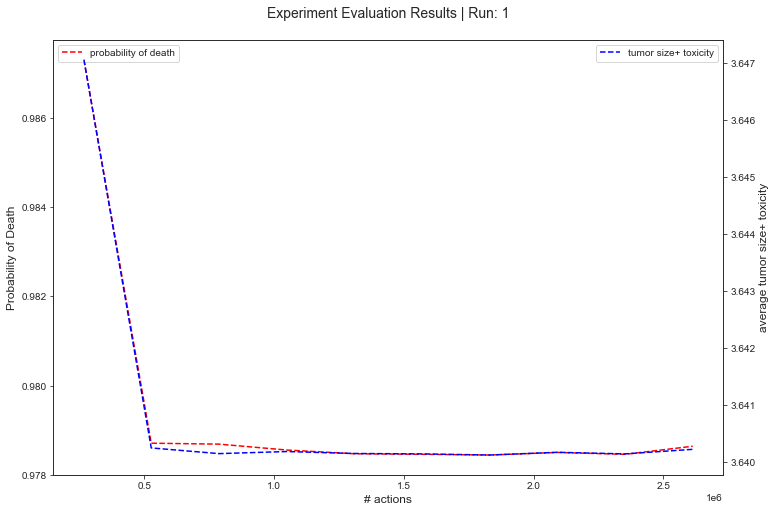

In [12]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 9
                                                , treatment_length_eval     = 9
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()